In [3]:
%%HTML
<style> code {background-color : pink !important;} </style>

Camera Calibration with OpenCV
===

### Run the code in the cell below to extract object points and image points for camera calibration.  

In [35]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import pickle
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# termination criteria
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    imagename = fname.split('\\')[-1]
    imagename_root, imagename_ext = imagename.split('.')
    img = cv2.imread(fname)


    
    # found that blue channel gave better results than grayscale,red,green,or h,s,v
    blue,g,r = cv2.split(img)
    
    # ran some experiments on manually thresholding
    #get a grayscale
    #gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    #gray_eq = cv2.equalizeHist(gray)
    #cv2.threshold(gray_eq, threshold, Max_val, type) type - THRESH_BINARY
    #res, gray_threshold = cv2.threshold(gray_eq, 60, 255, cv2.THRESH_BINARY)

    intersections = (9,6)

    '''
    values for Flags in findChessboardCorners - could not locate with this python library - 
        { 
          cv::CALIB_CB_ADAPTIVE_THRESH = 1, 
          cv::CALIB_CB_NORMALIZE_IMAGE = 2, 
          cv::CALIB_CB_FILTER_QUADS = 4, 
          cv::CALIB_CB_FAST_CHECK = 8 
        }
    '''
    ret, corners = cv2.findChessboardCorners(blue, intersections, 1+2)
    chessboard = blue
        
# try using individual BGR channels instead
    if ret != True:  
        ret, corners = cv2.findChessboardCorners(g, intersections, 1+2)
        if ret != True:  
            ret, corners = cv2.findChessboardCorners(r, intersections, 1+2)
            if ret == True:
                print("found corners with R channel on image {}".format(imagename_root))
                chessboard = r
            else:
                chessboard = blue # best bet
        else:
            print("found corners with G channel on image {}".format(imagename_root))
            chessboard = g

    #    while ret
    #    ret, corners = cv2.findChessboardCorners(r, (9,6), None)
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        
        #subpixel location (probably not that much use for our case)
        corners2 = cv2.cornerSubPix(chessboard, corners,(11,11),(-1,-1),criteria)
        imgpoints.append(corners2)
        
        # Draw and display the corners
        cv2.drawChessboardCorners(img, intersections, corners2, ret)
        write_name = './output_images/corners_found'+str(imagename_root)+'.png'
        cv2.imwrite(write_name, img)
#        cv2.imshow('img', img)
#        cv2.waitKey(500)
    else:
        print("No result for idx:{} fname: {}".format(idx, imagename))
        #try good features to track to see what is showing up
        cornersF = cv2.goodFeaturesToTrack(chessboard,54+10,0.01,10)
        cornersF = np.int0(cornersF)
        for i in cornersF:
            x,y = i.ravel()
            cv2.circle(img,(x,y),3,255,-1)
        cv2.imshow('FeaturestoTrack',img)
        cv2.waitKey(500)
        cv2.imwrite('./output_images/notfound'+str(imagename_root)+'.png',img);
        cv2.destroyAllWindows()

# Do camera calibration given object points and image points
img_size = (img.shape[1],img.shape[0])
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)

#lets see what the error is 
tot_error = 0
for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i],imgpoints2, cv2.NORM_L2)/len(imgpoints2)
    tot_error += error
print("total error: {}".format(tot_error/len(objpoints)))

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "./camera_cal/cal_dist_pickle.p", "wb" ) )


No result for idx:0 fname: calibration1.jpg
No result for idx:15 fname: calibration5.jpg
total error: 0.1109489333060773


In [38]:
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

def corners_unwarp(img, nx, ny, in_mtx, in_dist, imagename):  
    # Use the OpenCV undistort() function to remove distortion
    new_mtx = in_mtx
    h,  w = img.shape[:2]
    new_mtx, roi=cv2.getOptimalNewCameraMatrix(in_mtx,in_dist,(w,h),1,(w,h))
    undist = cv2.undistort(img, in_mtx, in_dist, None, new_mtx)
    
    
    h,  w = undist.shape[:2]
    img_size = (w, h)
            
    # generate the desired board shape in output based on known dimensions
    offset_x = int(w/4) #1280/5 = 256
    offset_y = int(h/4) #720/5 = 144
    int_board_x = int(w * 0.4)
    int_board_y = int(w * 0.4 * 5 / 8)
    dst = np.float32([[offset_x, offset_y],
                          [offset_x+int_board_x, offset_y], 
                          [offset_x + int_board_x, offset_y + int_board_y], 
                          [offset_x, offset_y + int_board_y]])
       
       
    gray = cv2.cvtColor(undist, cv2.COLOR_BGR2GRAY)

    # Search for corners in the image
    ret, corners = cv2.findChessboardCorners(gray, (nx, ny), 1+2+4)
    if ret != True:  
        # try switching to blue channel
        gray_in,g,r = cv2.split(img)
        gray = cv2.undistort(gray_in, in_mtx, in_dist, None, new_mtx)
        ret, corners = cv2.findChessboardCorners(gray, intersections, 1+2+4)

    if ret == True:
        corners = cv2.cornerSubPix(gray, corners,(11,11),(-1,-1),criteria)
        # If we found corners, draw them! (just for fun)
        cv2.drawChessboardCorners(undist, (nx, ny), corners, ret)      
        # grab the outer four detected corners as source locations
        src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
      
        # Given src and dst points, calculate the perspective transform matrix
        M = cv2.getPerspectiveTransform(src, dst)
        
        # Warp the image using OpenCV warpPerspective()
        warped = cv2.warpPerspective(undist, M, img_size)
        warped = np.copy(warped)
    else:
        print("corners Not found on img {}".format(imagename))
        cornersF = cv2.goodFeaturesToTrack(gray,64,0.01,10)
        cornersF = np.int0(cornersF)
        for i in cornersF:
            x,y = i.ravel()
            cv2.circle(undist,(x,y),3,255,-1)
        cv2.imshow('FeaturestoTrack',undist)
        cv2.waitKey(5000)
        cv2.imwrite('./output_images/unwarped_nocorners'+str(imagename)+'.png',gray);
        warped = np.array([0])
    
    # Return the resulting image and matrix
    cv2.destroyAllWindows()
    return ret, warped #, M

### If the above cell ran sucessfully, you should now have `objpoints` and `imgpoints` needed for camera calibration.  Run the cell below to calibrate, calculate distortion coefficients, and test undistortion on an image!

corners Not found on img calibration1
Unsuccesful on image ./camera_cal\calibration1.jpg try 8*5 instead
corners Not found on img calibration1
No luck...
corners Not found on img calibration2
Unsuccesful on image ./camera_cal\calibration2.jpg try 8*5 instead
corners Not found on img calibration2
No luck...
corners Not found on img calibration4
Unsuccesful on image ./camera_cal\calibration4.jpg try 8*5 instead
corners Not found on img calibration4
No luck...
corners Not found on img calibration5
Unsuccesful on image ./camera_cal\calibration5.jpg try 8*5 instead
corners Not found on img calibration5
No luck...


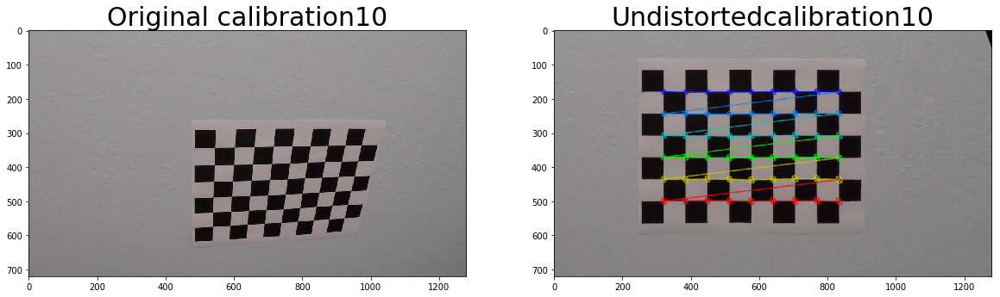

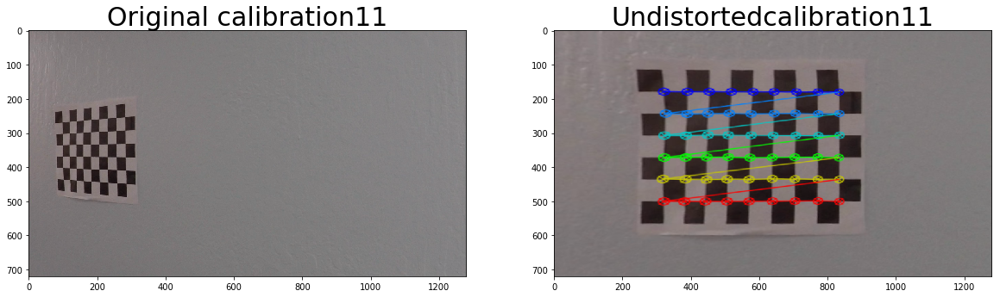

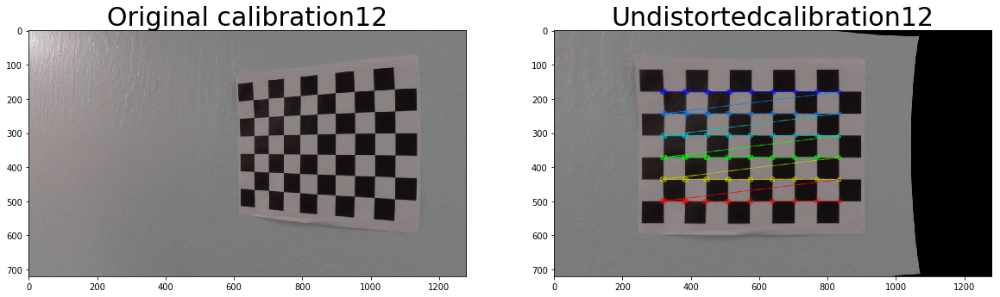

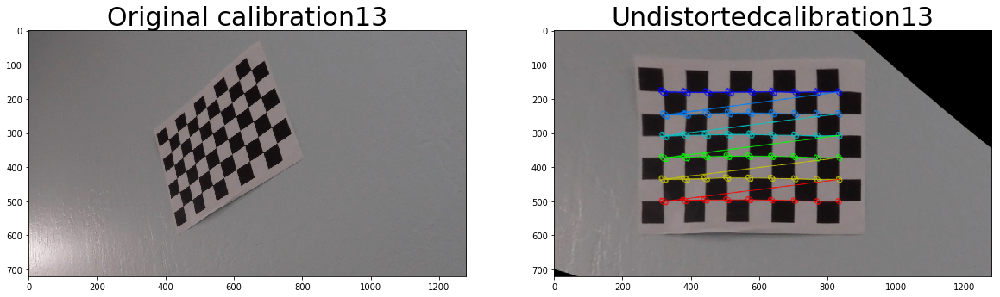

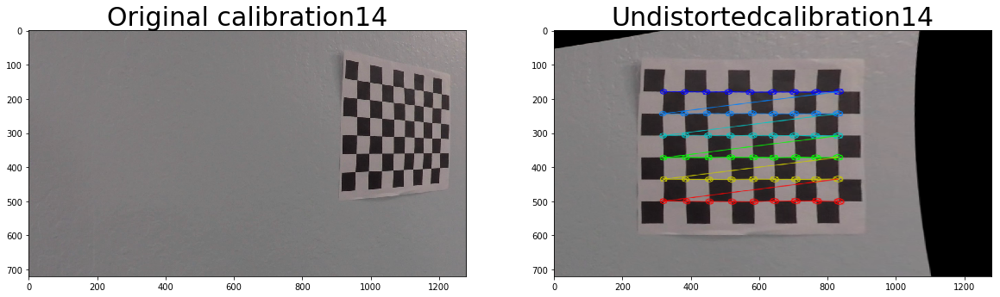

...

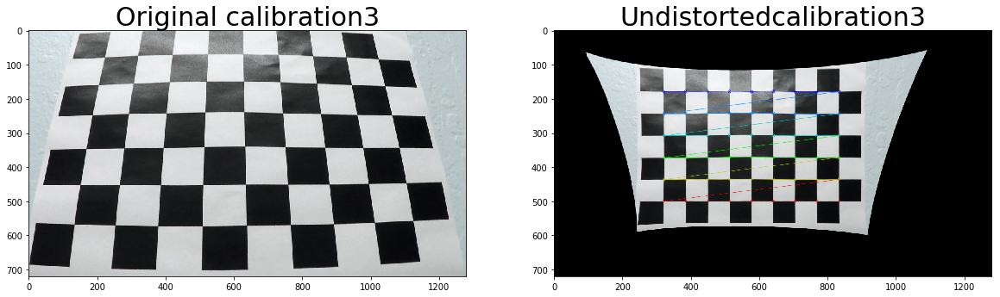

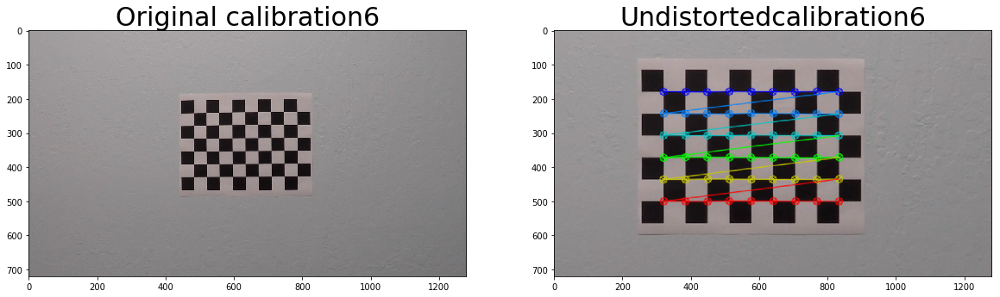

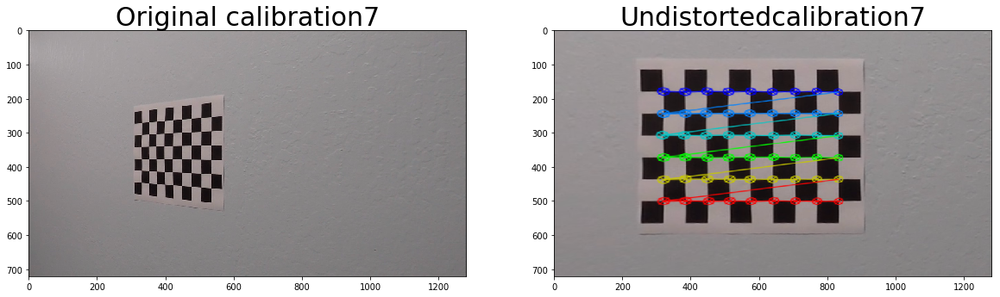

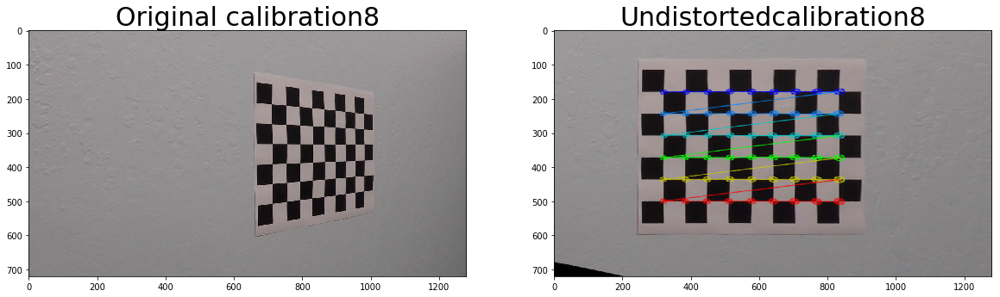

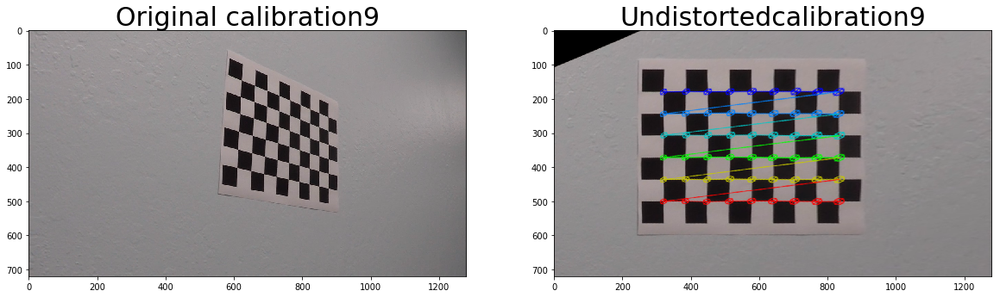

In [39]:
import pickle
%matplotlib inline

dist_pickle = pickle.load( open( "./camera_cal/cal_dist_pickle.p", "rb" ) )
mtx = dist_pickle["mtx"]
dist = dist_pickle["dist"]


def plot_undist(warped_img,unwarped_img,img_name):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(warped_img)
    ax1.set_title('Original ' +  img_name, fontsize=30)
    ax2.imshow(unwarped_img)
    ax2.set_title('Undistorted' + img_name, fontsize=30);

# Test undistortion on an image
for idx, fname in enumerate(images):
    imagename = fname.split('\\')[-1]
    imagename_root, imagename_ext = imagename.split('.')
    #print("idx: {}, fname: {}".format(idx, imagename_root))
    img = cv2.imread(fname)
    #plot_undist(img, img)
    ret, img_unwarped = corners_unwarp(img, 9, 6, mtx, dist, imagename_root)
    if ret == True:
        plot_undist(img, img_unwarped, imagename_root)
        cv2.imwrite('./output_images/warped'+str(imagename_root)+'.png',img_unwarped);
    else:
        print("Unsuccesful on image {} try 8*5 instead".format(fname))
        ret, img_unwarped = corners_unwarp(img, 8, 5, mtx, dist, imagename_root)
        if ret == True:
            plot_undist(img, img_unwarped, imagename_root)
            cv2.imwrite('./output_images/warped'+str(imagename_root)+'.png',img_unwarped);
        else:
            print("No luck...")
            

can't get the chessboard detector to work on four images 1, 2, 4, 5

Min Angular value is 0.0 and Max value is 0.5.


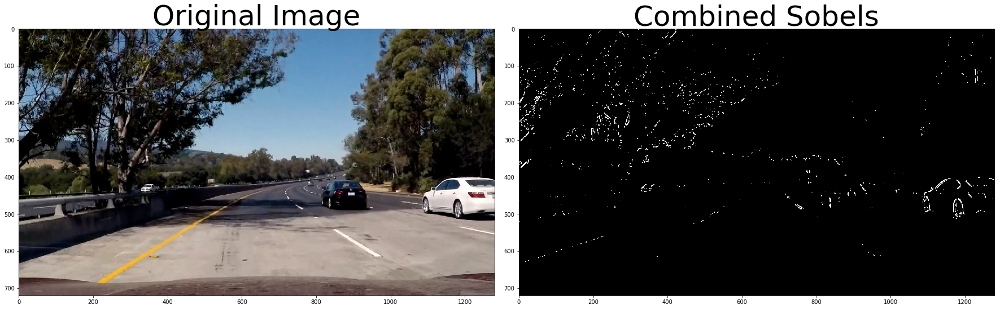

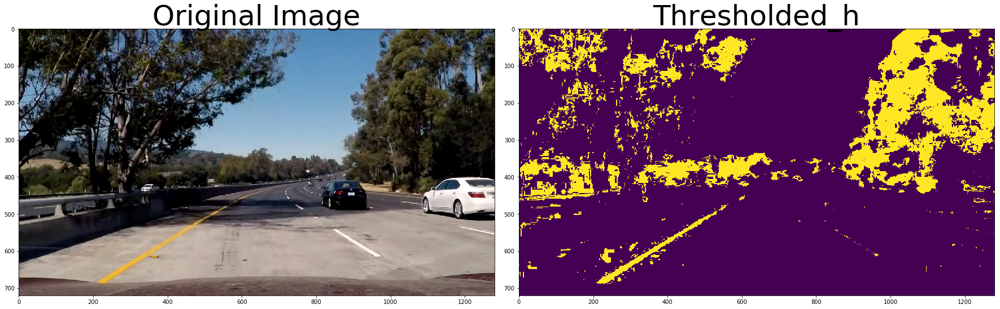

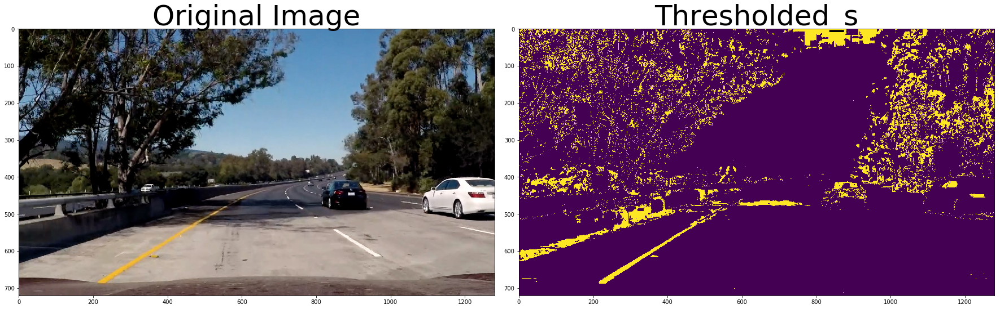

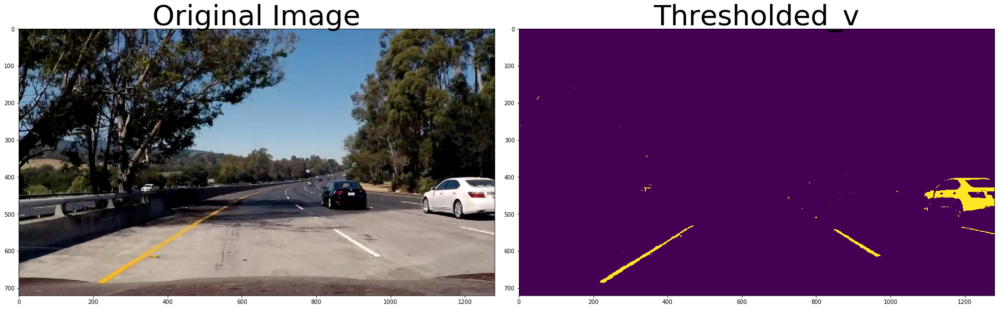

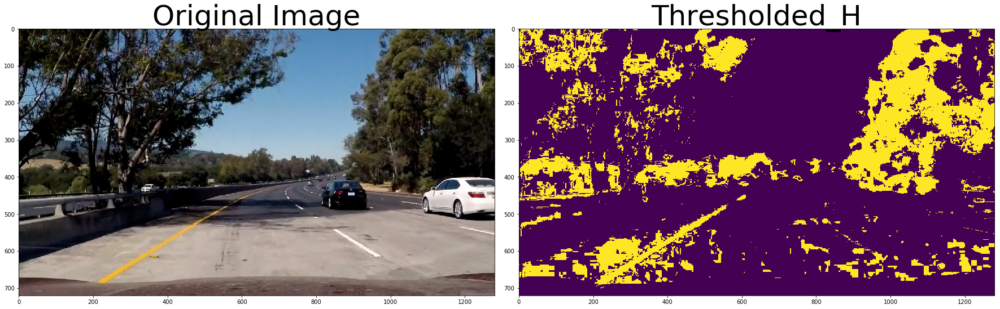

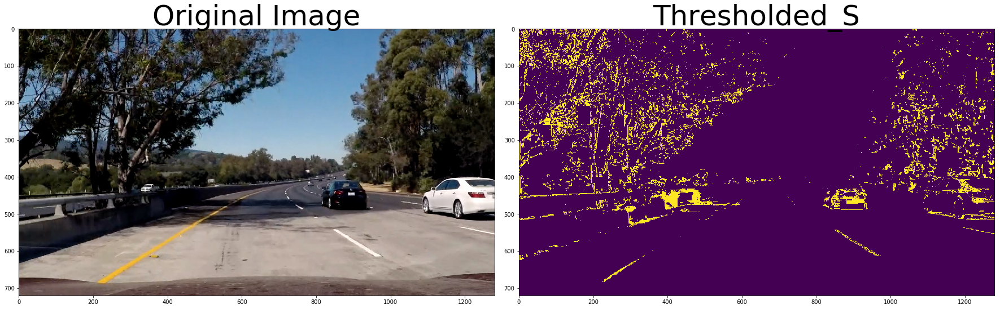

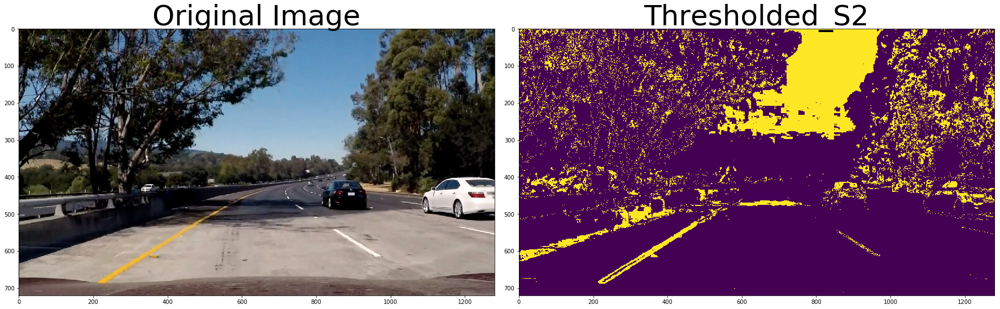

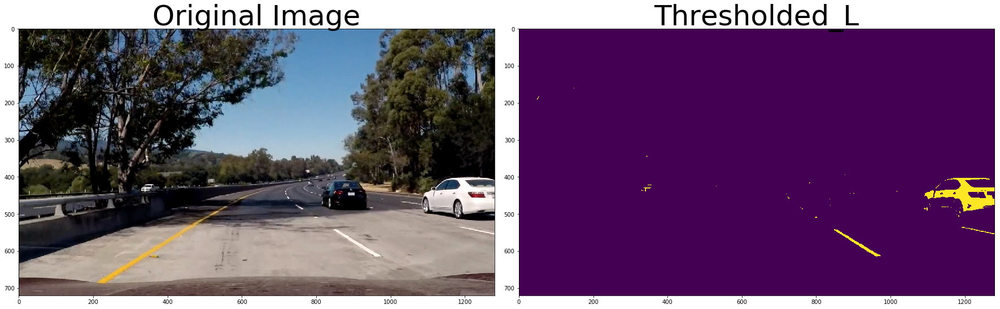

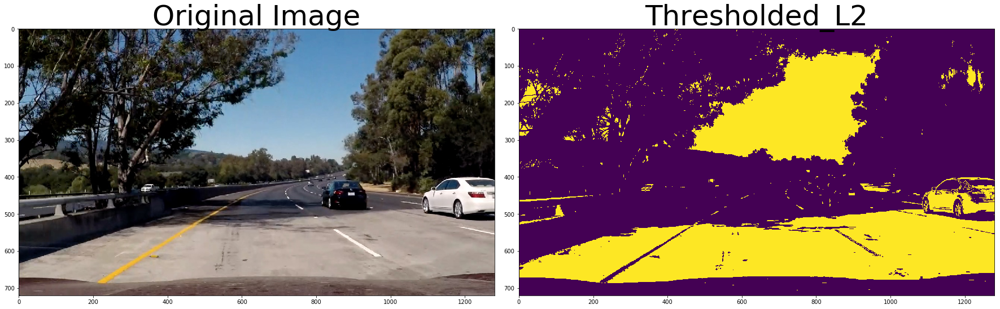

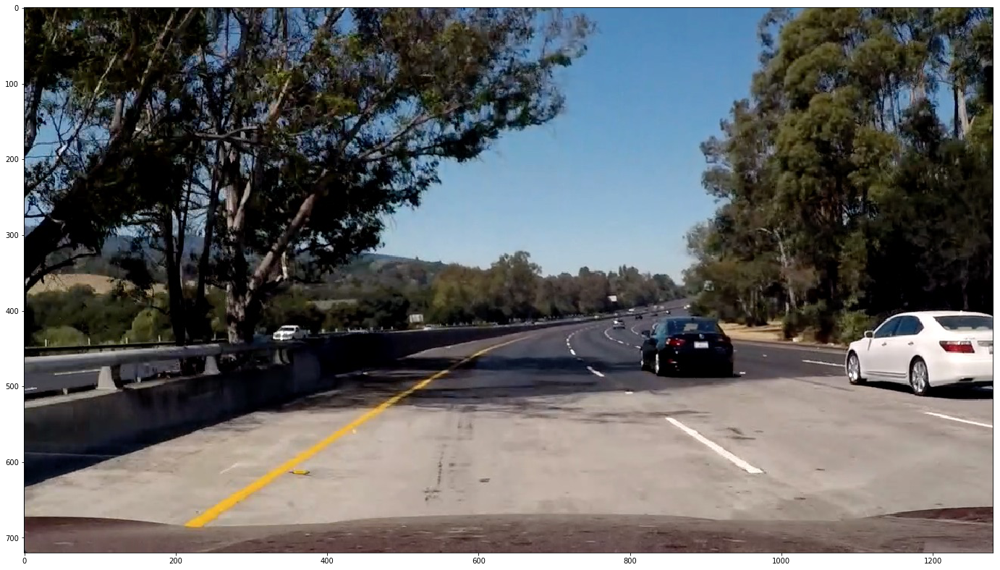

In [431]:
import numpy as np
import cv2
import matplotlib.pyplot as plt



# signs_vehicles_xygrad.png
# straight_lines1.jpg
image = cv2.imread('./test_images/test5.jpg')
imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)


'''
sobel_thresh
input: single plane image
choice to apply sobel in x, y or both and using different derivative or filter kernel size
'''
def sobel_thresh(img, orient=X_DIR, thresh_min=0, thresh_max=255, ksize=3, deriv=1):
    if img.ndim != 2:
        print("Error in sobel_thresh: img is supposed to have 2 dimensions, but has {} dimensions".format(img.ndim))
        return False, np.array([0])
     
    X_DIR = 1
    Y_DIR = 2
    MAGNITUDE = 4+2+1
    ANGLE = 8+2+1
        
    # Take the derivative in x or y
    if orient & X_DIR == X_DIR:
        sobel = cv2.Sobel(img, cv2.CV_64F, 1*deriv, 0, ksize=ksize)
        #3) Take the absolute value of the derivative or gradient
        abs_sobelx = np.absolute(sobel)
        abs_sobel = abs_sobelx
    if orient & Y_DIR == Y_DIR:
        sobel = cv2.Sobel(img, cv2.CV_64F, 0, 1*deriv, ksize=ksize)
        #Take the absolute value of the derivative or gradient
        abs_sobely = np.absolute(sobel)
        abs_sobel = abs_sobely

    #calculate magnitude or angle and scale output to range 0-255
    if orient == MAGNITUDE:
        magnitude = np.sqrt(abs_sobelx**2 + abs_sobely**2)
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*magnitude/np.max(magnitude))
    elif orient == ANGLE:
        angle = np.arctan2(abs_sobely, abs_sobelx)
        # scale to pi/2 = 255 - the direction is important
        print("Min Angular value is {} and Max value is {}.".format(np.min(angle/np.pi),np.max(angle/np.pi)))
        scaled_sobel = np.uint8(255*angle/(np.pi/2))
    else:      
        # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
        scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
        
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max   
    sbinary = np.zeros_like(scaled_sobel)
    sbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    
    # 6) Return this mask as your binary_output image
    return True, sbinary
    


# Run the function
#for min_threshold in range(0 ,10, 10):
#    for max_threshold in range(20, 250, 40):
#        for ksize in range(3,9,2):
image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
h,s,v = cv2.split(image_hsv)

image_hls = cv2.cvtColor(image, cv2.COLOR_BGR2HLS)
H = image_hls[:,:,0]
L = image_hls[:,:,1]
S = image_hls[:,:,2]

inp = v
ret, x_binary = sobel_thresh(inp, orient=X_DIR, thresh_min=50, thresh_max=255,ksize=7)
ret, y_binary = sobel_thresh(inp, orient=Y_DIR, thresh_min=50, thresh_max=255,ksize=7)
ret, grad_binary = sobel_thresh(inp, orient=ANGLE, thresh_min=0, thresh_max=127,ksize=7)
ret, mag_binary = sobel_thresh(inp, orient=MAGNITUDE, thresh_min=128, thresh_max=250,ksize=7)
outp = np.zeros_like(inp)
outp[((x_binary == 1) & (y_binary == 1)) | ((grad_binary==1)&(mag_binary==1))] = 1

#grad_binary = abs_sobel_thresh(image, orient=ANGLE, thresh_min=min_threshold, thresh_max=max_threshold,ksize=ksize)

# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(imageRGB)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(outp, cmap='gray')
ax2.set_title('Combined Sobels', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


thresh_h = np.zeros_like(inp)
thresh_s = np.zeros_like(inp)
thresh_v = np.zeros_like(inp)
thresh_H = np.zeros_like(inp)
thresh_S = np.zeros_like(inp)
thresh_S2 = np.zeros_like(inp)
thresh_L = np.zeros_like(inp)
thresh_L2 = np.zeros_like(inp)

thresh_h[(h>17) & (h<=(31))]=1
thresh_s[(s>140) & (s<=(240))]=1
thresh_v[(v>225)]=1
thresh_H[(H>14) & (H<=(30))]=1
thresh_S[(S>220)]=1
thresh_S2[(S>100)&(S<220)]=1
thresh_L[(L>220)]=1
thresh_L2[(L>140)&(S<180)]=1

pics =[thresh_h, thresh_s, thresh_v, thresh_H, thresh_S, thresh_S2, thresh_L, thresh_L2]
names =["h","s","v","H","S","S2","L","L2"]
for pic,name in zip(pics,names):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(imageRGB)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(pic)
    ax2.set_title('Thresholded_'+name, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

    
f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(imageRGB)
#bottom = 140
#top =  np.max(H)
#step = 10#int((top - bottom)/20)
#for low in range(bottom,top,step*2):
#    img_thresh = np.zeros_like(inp)
#    img_thresh[(H>low) & (H<=(low+step))]=1
#    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
#    f.tight_layout()
#    ax1.imshow(img_thresh)
#    ax1.set_title('Thresholded H range'+str(low)+'_'+str(low+step), fontsize=50)
#    img_thresh = np.zeros_like(inp)
#    img_thresh[(H>(low+step)) & (H<=(low+step*2))]=1
#    ax2.imshow(img_thresh)
#    ax2.set_title('Thresholded H range'+str(low+step)+'_'+str(low+step*2), fontsize=50)
#    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [340]:
import pickle
%matplotlib inline


'''
information needed for undistort
'''
dist_pickle = pickle.load( open( "./camera_cal/cal_dist_pickle.p", "rb" ) )
undistort_mtx = dist_pickle["mtx"]
undistort_dist = dist_pickle["dist"]

'''
func: undistort
removes intrinsic camera distortion effects
leaves black in frame (does not crop) outside visible edges of corrrected image
'''
def undistort(img):  
    # Use the OpenCV undistort() function to remove distortion
    h,  w = img.shape[:2]
    new_mtx, roi=cv2.getOptimalNewCameraMatrix(undistort_mtx,undistort_dist,(w,h),1,(w,h))
    undist = cv2.undistort(img, undistort_mtx, undistort_dist, None, new_mtx)
    return undist

'''
information needed for birdseye_transform 
'''
#done without correcting for camera distortion
#birdseye_src = np.float32([[596, 450],
#                  [685,450], 
#                  [1023, 667], 
#                  [283, 667]])
#done without correcting for camera distortion
#birdseye_dst = np.float32([[400, 0],
#                  [880,0], 
#                  [880,720], 
#                  [400,720]])

birdseye_src = np.float32([[617, 450],
                           [711, 450], 
                           [988, 626], 
                           [359, 626]])

birdseye_dst = np.float32([[580, 0],
                           [700, 0], 
                           [700,720], 
                           [580,720]])
'''
func: birdseye_transform()
transform image from perspective view to overhead (birdseye) view
'''
def birdseye_transform(img):
    # Given src and dst points, calculate the perspective transform matrix
    birdseye_M = cv2.getPerspectiveTransform(birdseye_src, birdseye_dst)
    img_size = (img.shape[1],img.shape[0])
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(img, birdseye_M, img_size)
    return warped


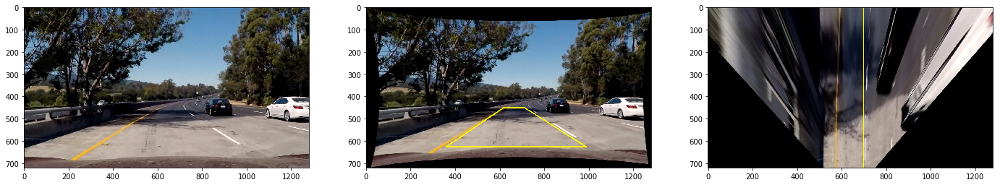

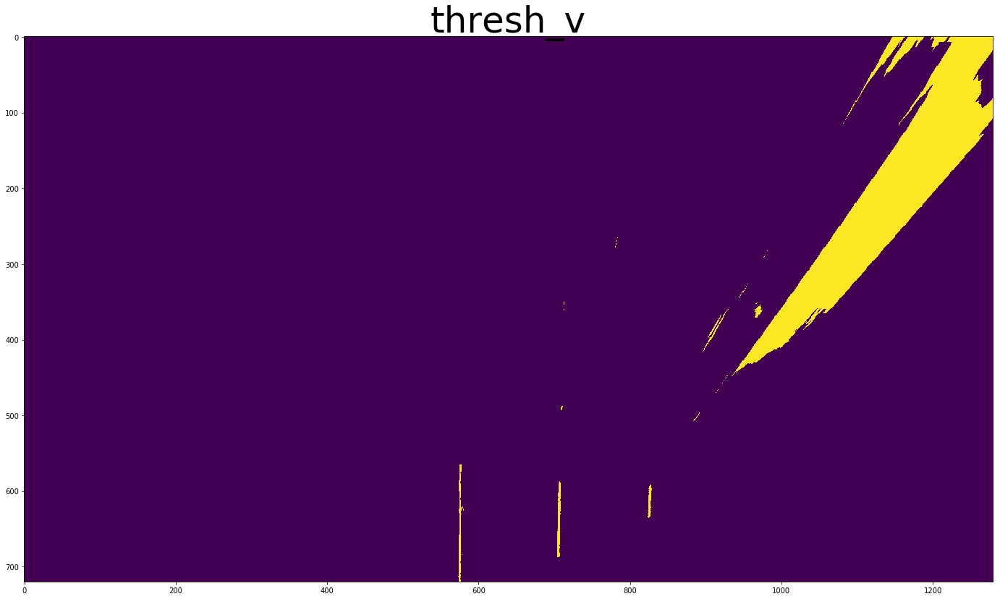

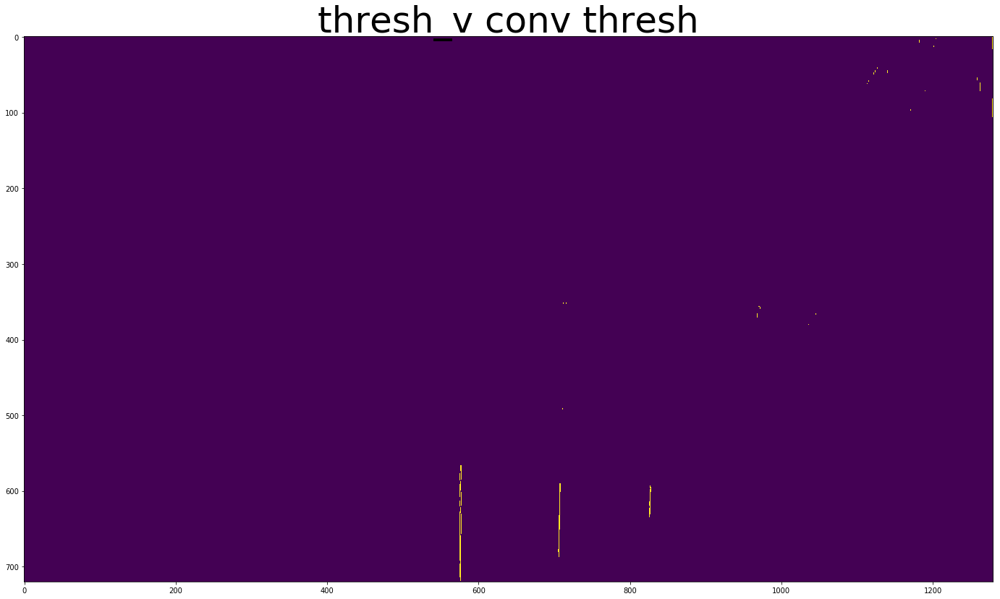

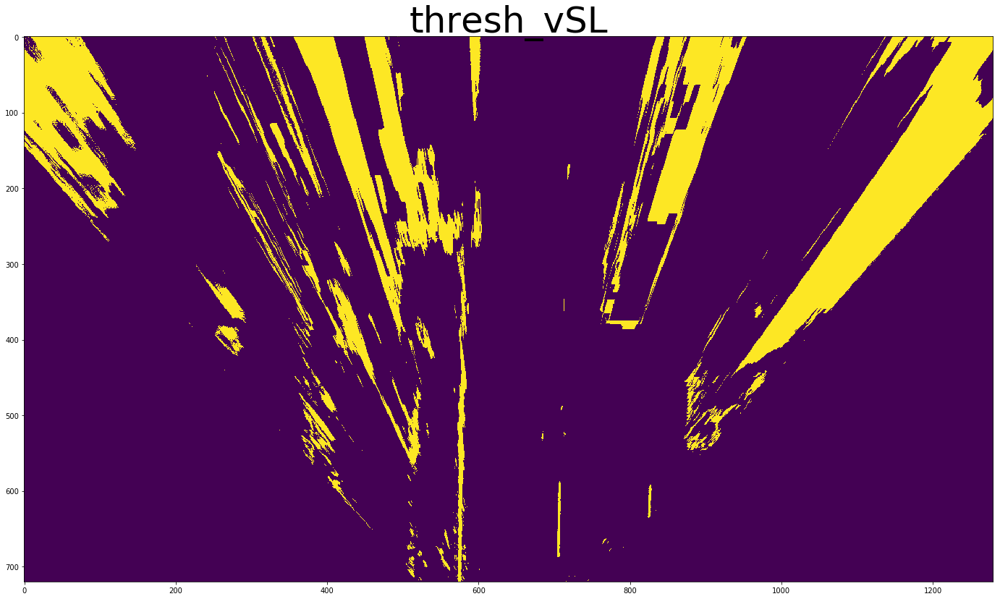

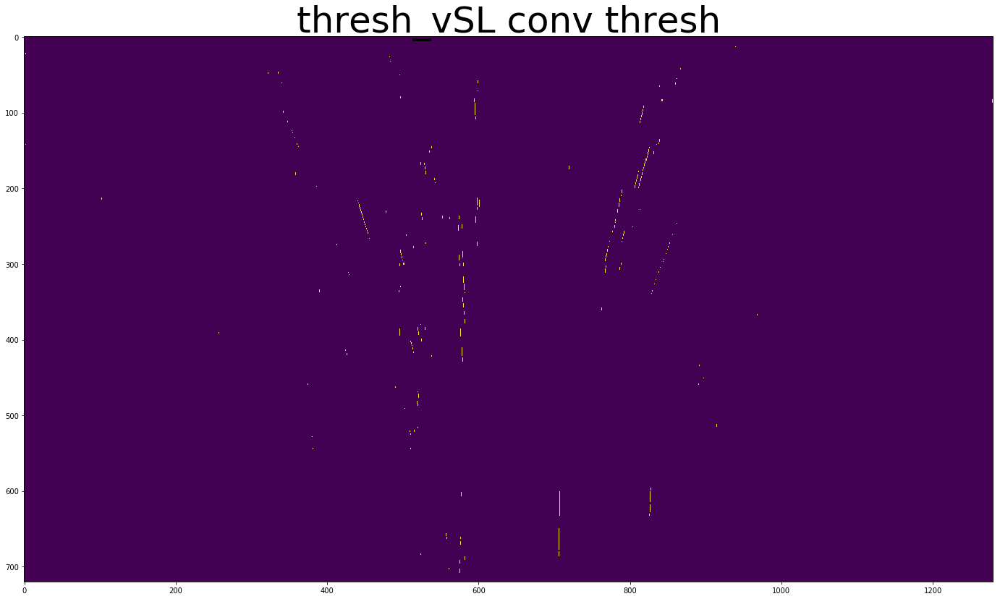

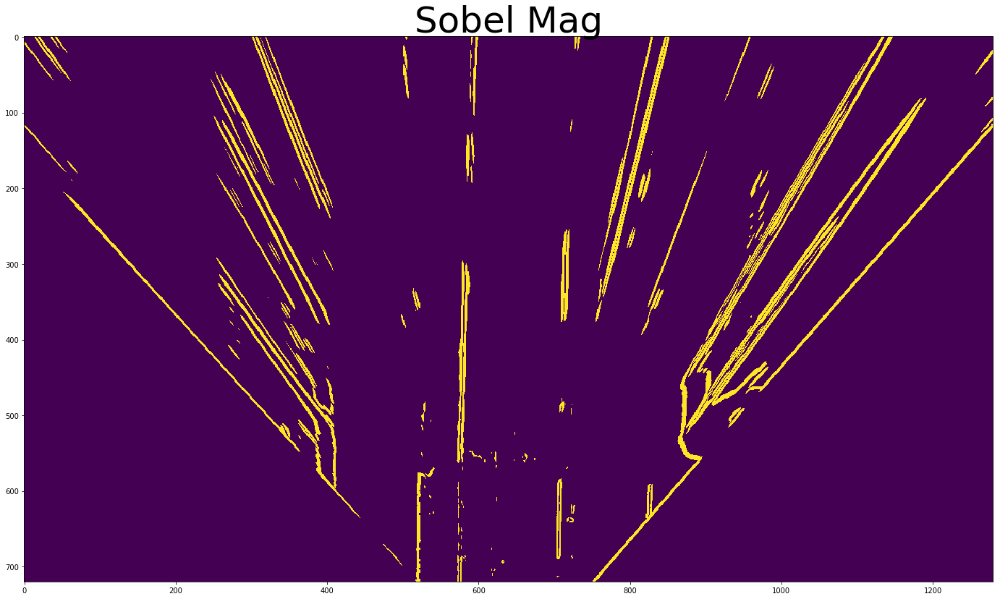

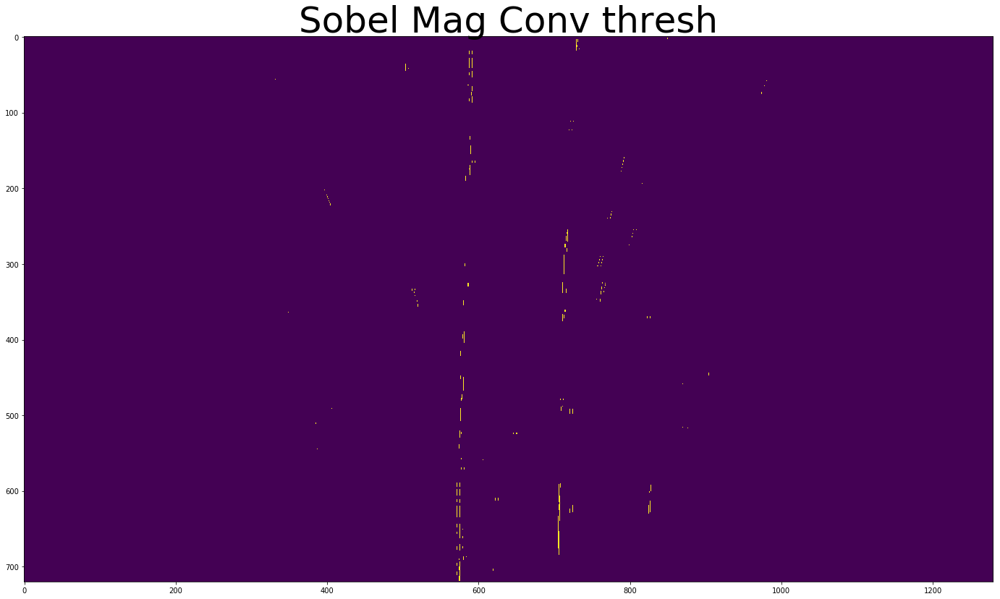

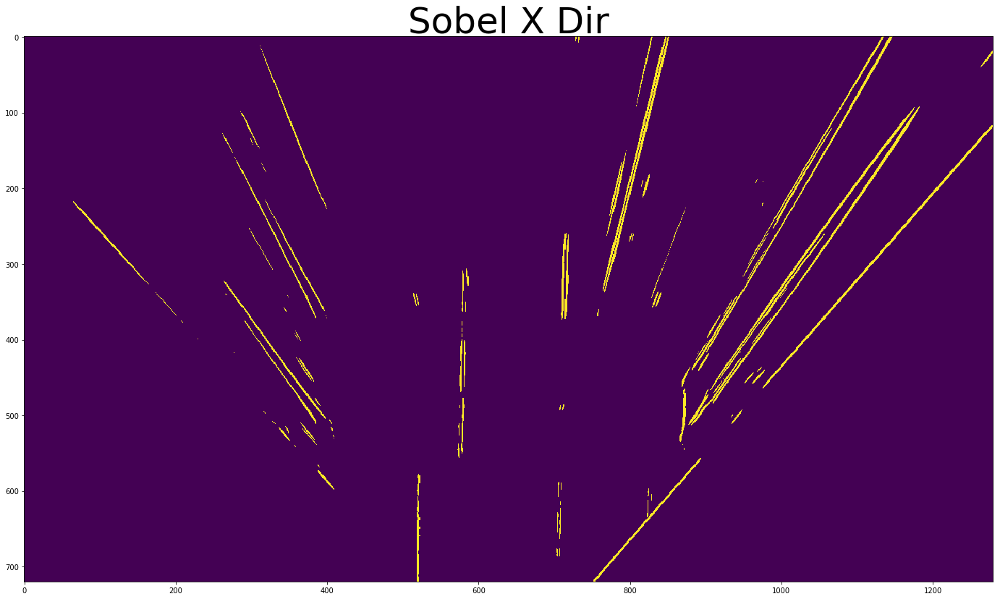

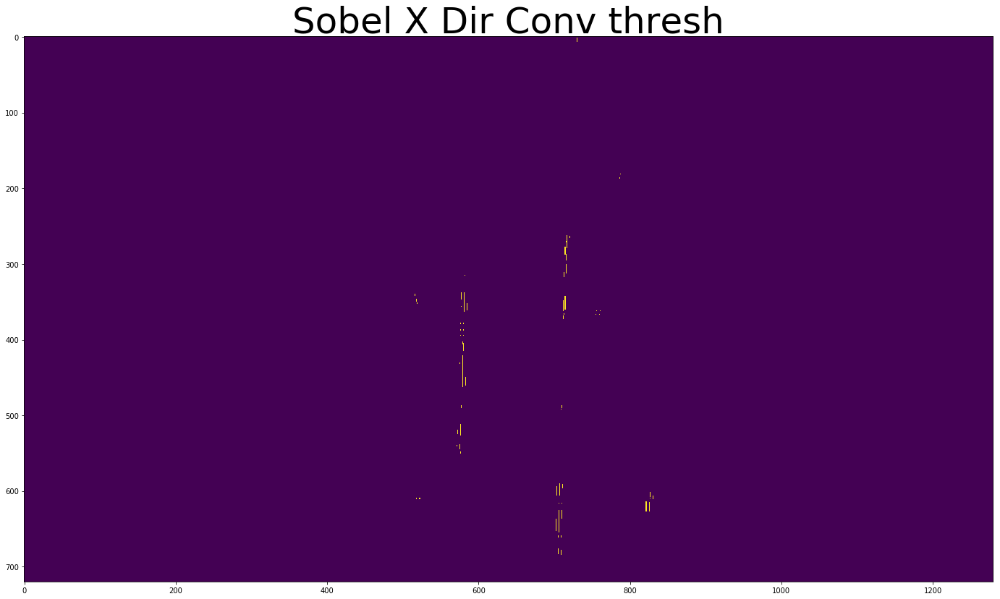

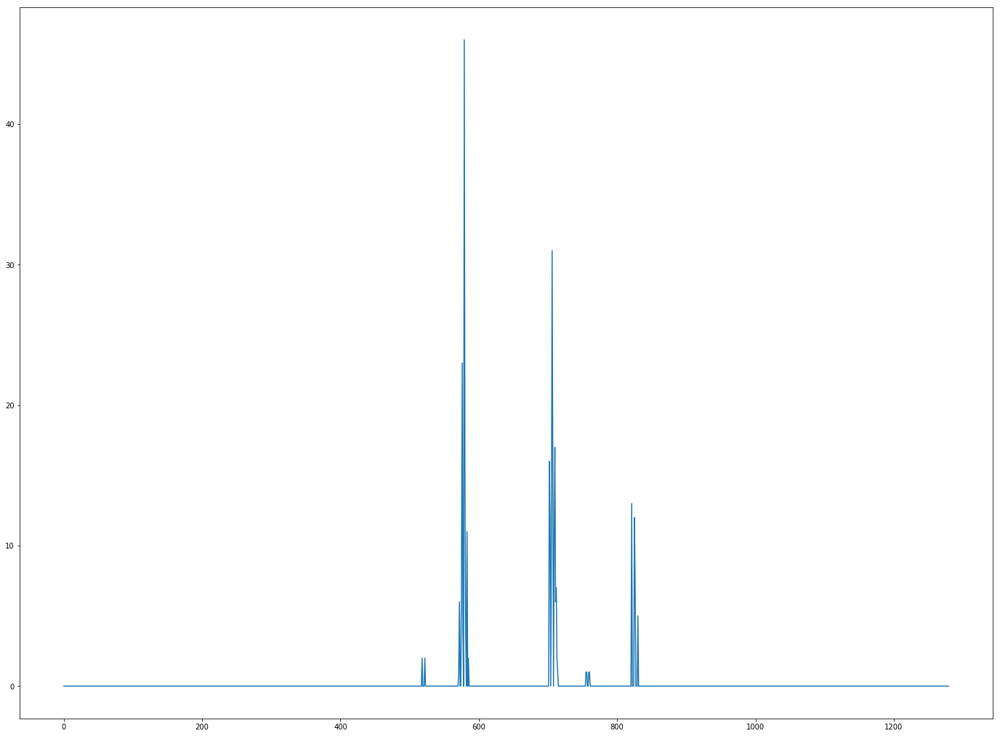

In [438]:
import scipy.signal
#image = cv2.imread('./test_images/straight_lines1.jpg')
image = cv2.imread('./test_images/test5.jpg')
imageRGB = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Apply the fix for camera distortion
true_image = undistort(image)
true_imageRGB = cv2.cvtColor(true_image, cv2.COLOR_BGR2RGB)
cv2.polylines(true_imageRGB, [np.int32(birdseye_src)], True, (255,255,0), 3)
#put the display image back to BGR to save.
true_imageBGR = cv2.cvtColor(true_imageRGB, cv2.COLOR_RGB2BGR)
#cv2.imwrite('./output_images/undistorted_straight_lines1.png', true_imageBGR)


# Transform the image to view from above(birdseye)
birdseye_image = birdseye_transform(true_image)
birdseye_imageRGB = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2RGB)
cv2.polylines(birdseye_imageRGB, [np.int32(birdseye_dst)], True, (255,255,0), 1)
#put the display image back to BGR to save.
birdseye_imageBGR = cv2.cvtColor(birdseye_imageRGB, cv2.COLOR_RGB2BGR)
#cv2.imwrite('./output_images/birdseye_straight_lines1.png', birdseye_imageBGR)

f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 18))
ax1.imshow(imageRGB)
ax2.imshow(true_imageRGB)
ax3.imshow(birdseye_imageRGB)


image_hsv = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2HSV)
#h,s,v = cv2.split(image_hsv)
h = image_hsv[:,:,0]
s = image_hsv[:,:,1]
v = image_hsv[:,:,2]




image_hls = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2HLS)
H = image_hls[:,:,0]
L = image_hls[:,:,1]
S = image_hls[:,:,2]


kernel2 = np.array([[-1,1,0,0,1,-1],
                   [-1,1,0,0,1,-1],
                   [-1,1,0,0,1,-1],
                   [-1,1,0,0,1,-1],
                   [-1,1,0,0,1,-1]])

kernel3 = np.array([[-1,2,-1,0,-1,2,-1],
                    [-1,2,-1,0,-1,2,-1],
                    [-1,2,-1,0,-1,2,-1],
                    [-1,2,-1,0,-1,2,-1],
                    [-1,2,-1,0,-1,2,-1]])


thresh_v = np.zeros_like(v)
thresh_v[(v>225)]=1

thresh_vSL = np.zeros_like(v)
thresh_vSL[(v>225)|(L>220)|(S>190)|((h>17) & (h<=31))]=1

f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(thresh_v)
ax.set_title('thresh_v', fontsize=50)

kernel = np.ones((100,7),np.uint8)
kernel[:,0:1] = 0
kernel[:,5:6] = 0
#kernel = np.ones((100,4),np.uint8)
#conv = cv2.filter2D(thresh_v,-1,kernel)
conv = scipy.signal.convolve2d(thresh_v, kernel2, mode='same')
rc = np.zeros_like(conv)
rc[conv>3]=1
f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.set_title('thresh_v conv thresh', fontsize=50)
ax.imshow(rc);


f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(thresh_vSL)
ax.set_title('thresh_vSL', fontsize=50)
#kernel = np.ones((100,4),np.float32)/400#.uint8)
#conv = cv2.filter2D(thresh_vSL,-1,kernel)
conv = scipy.signal.convolve2d(thresh_vSL, kernel2, mode='same')
f, ax = plt.subplots(1, 1, figsize=(24, 18))
rc = np.zeros_like(conv)
rc[conv>5]=1
ax.imshow(rc);
ax.set_title('thresh_vSL conv thresh', fontsize=50)

ret, mag_binary = sobel_thresh(v, orient=MAGNITUDE, thresh_min=32, thresh_max=255,ksize=5, deriv=1)
f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(mag_binary)
ax.set_title('Sobel Mag', fontsize=50)

#kernel = np.ones((100,4),np.uint8)#.float32)/400#
#conv_sobel = cv2.filter2D(x_binary,-1,kernel)
conv_sobel = scipy.signal.convolve2d(mag_binary, kernel3, mode='same')
rc = np.zeros_like(mag_binary)
rc[conv_sobel>7]=1
f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(rc);
ax.set_title('Sobel Mag Conv thresh', fontsize=50)

ret, x_binary = sobel_thresh(v, orient=X_DIR, thresh_min=75, thresh_max=255,ksize=5, deriv=1)
f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(x_binary)
ax.set_title('Sobel X Dir', fontsize=50)
x_binary1 = np.zeros_like(x_binary)
x_binary1[x_binary>=1]=255
cv2.imwrite('./output_images/X_DIR.png', x_binary1)
#kernel = np.ones((100,5),np.uint8) #/500
#conv = cv2.filter2D(x_binary,-1,kernel2)
conv = scipy.signal.convolve2d(x_binary, kernel3, mode='same')
f, ax = plt.subplots(1, 1, figsize=(24, 18))
rc = np.zeros_like(x_binary)
rc[conv>9]=1
ax.imshow(rc);
ax.set_title('Sobel X Dir Conv thresh', fontsize=50)
cv2.imwrite('./output_images/X_DIR_conv.png', conv)


#thresh_v = conv_sobel
f, ax = plt.subplots(1, 1, figsize=(24, 18))
histogram = np.sum(rc[rc.shape[0]//2:,:], axis=0)
plt.plot(histogram)



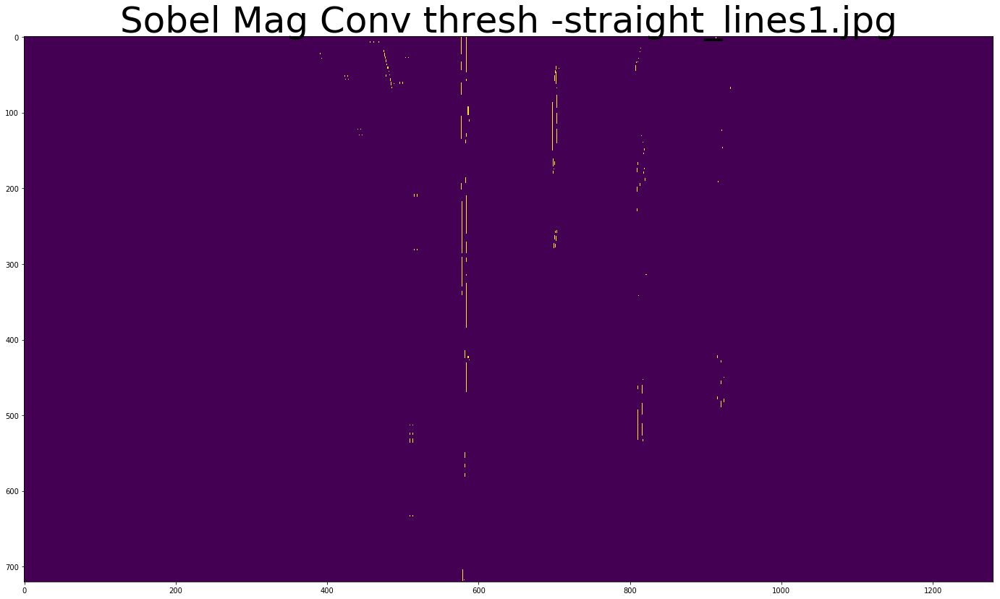

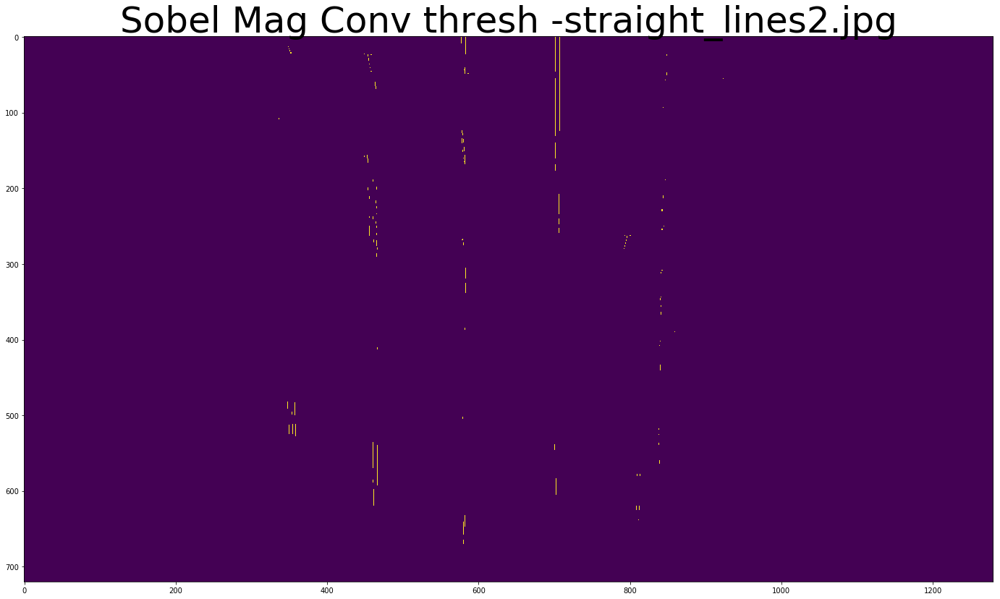

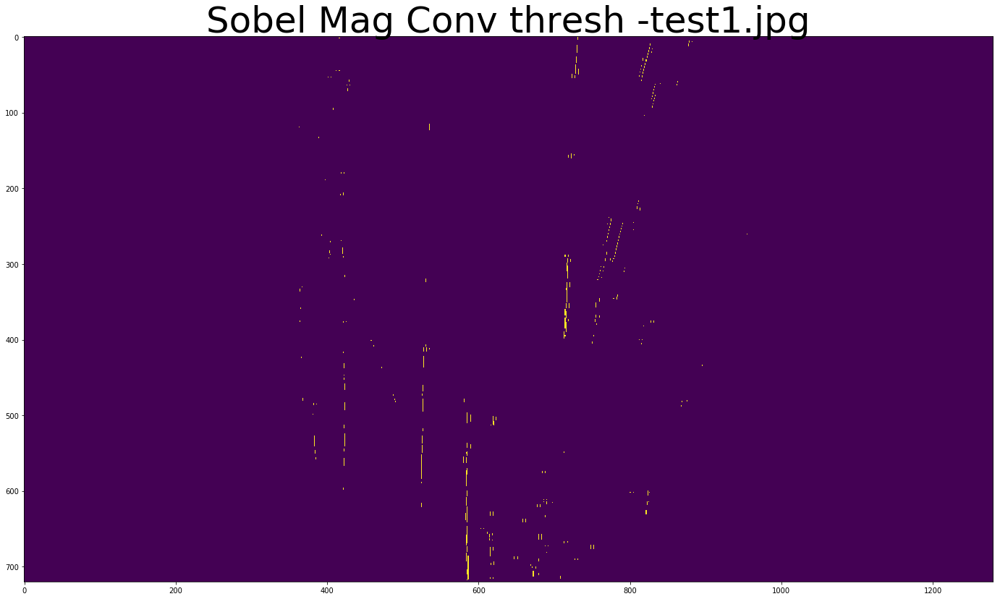

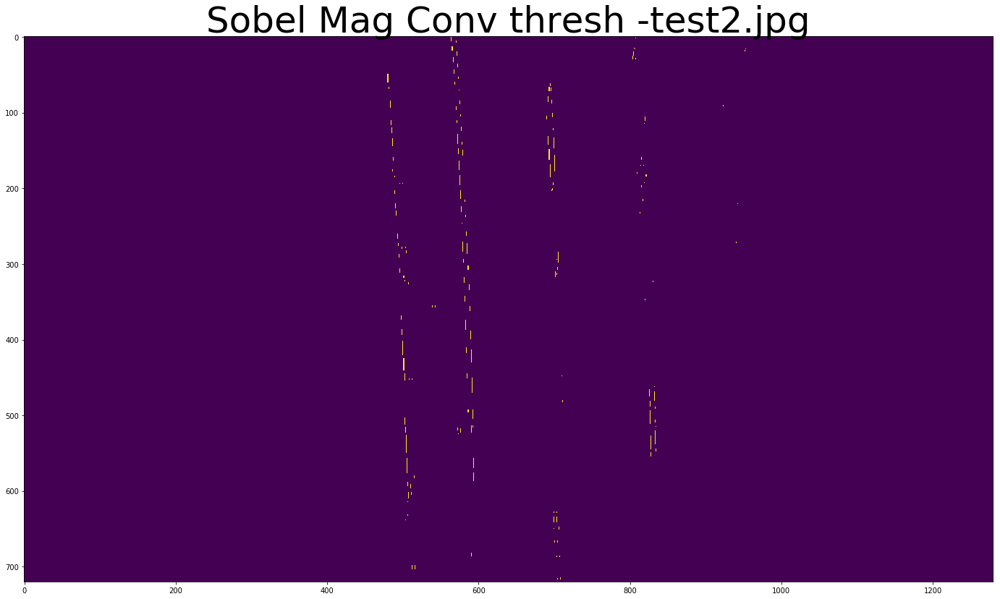

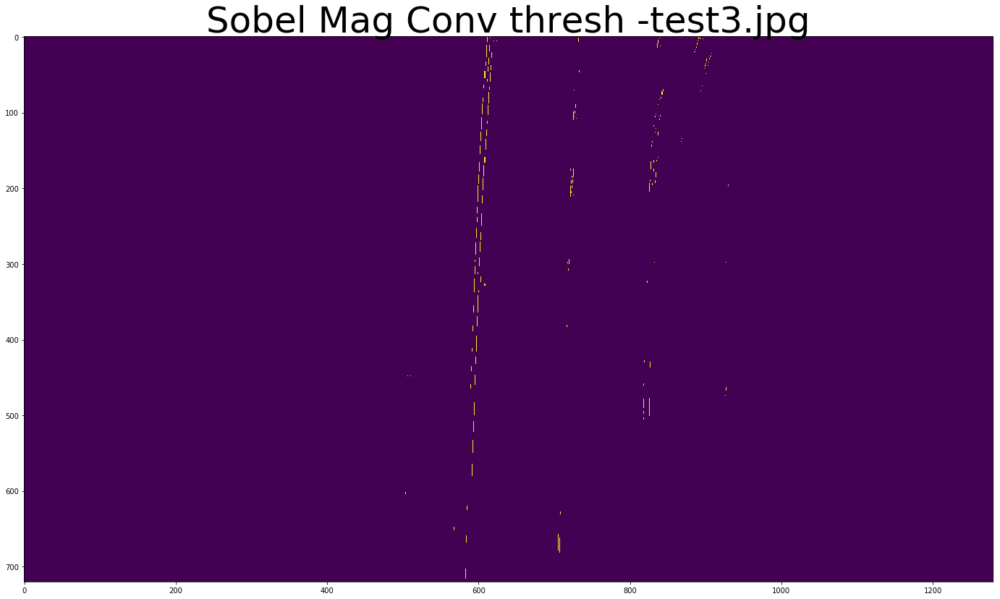

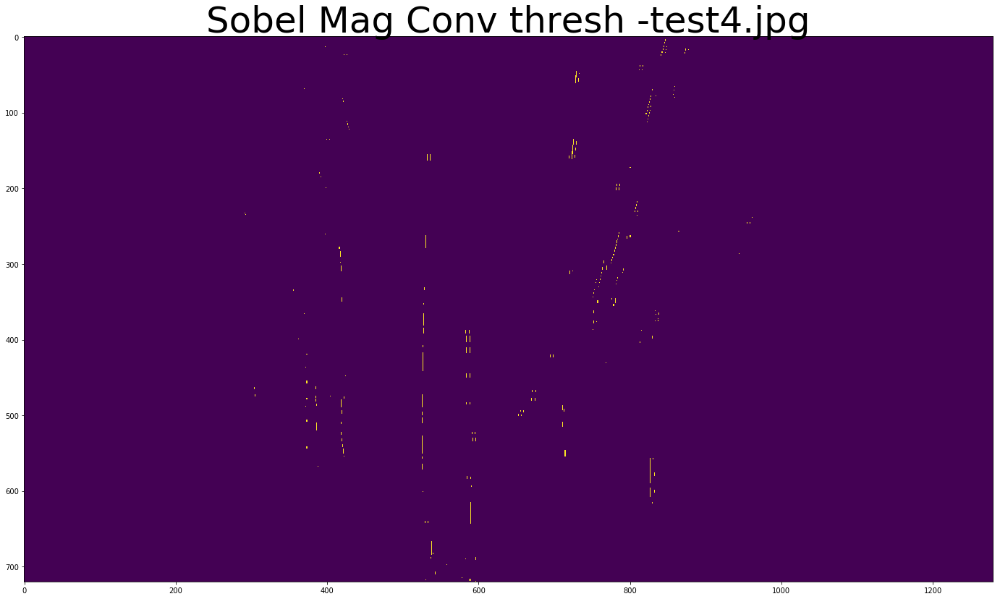

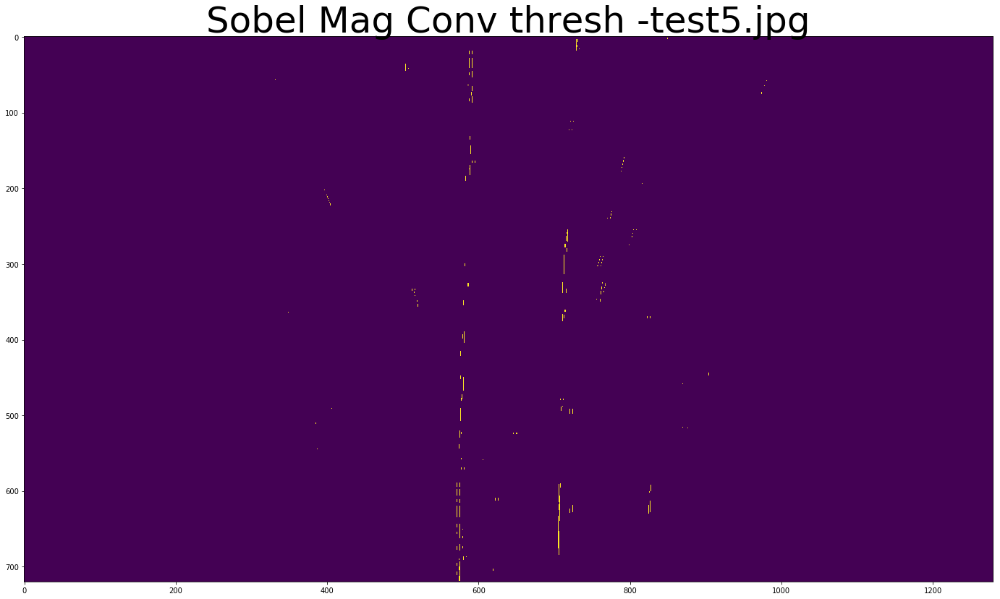

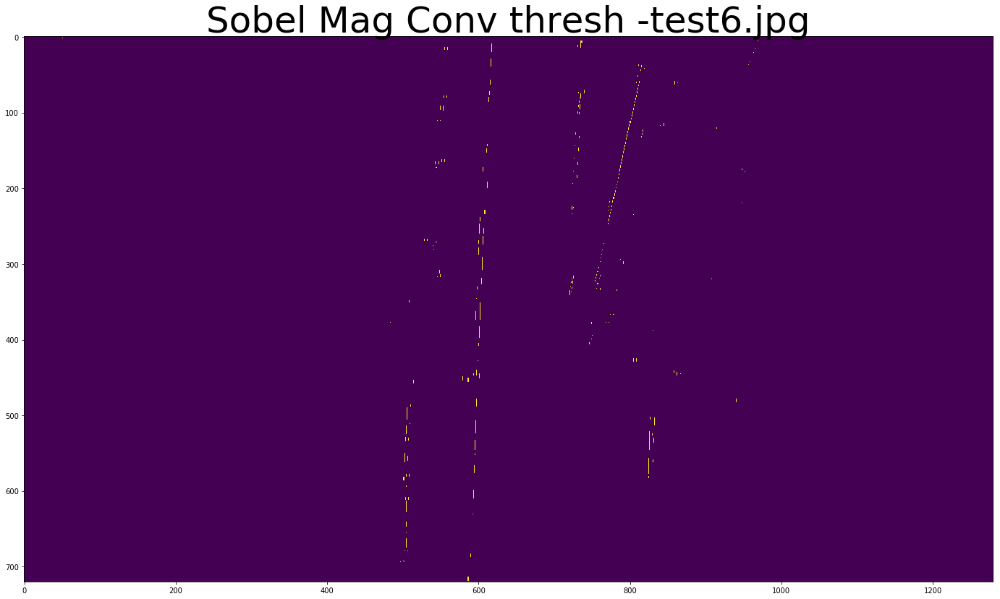

In [441]:
images = glob.glob('./test_images/*.jpg')

# Step through the list and search for chessboard corners
tests = []
for idx, fname in enumerate(images):
    imagename = fname.split('\\')[-1]
    imagename_root, imagename_ext = imagename.split('.')
    img = cv2.imread(fname)
    true_image = undistort(img)
    birdseye_image = birdseye_transform(true_image)
    image_hsv = cv2.cvtColor(birdseye_image, cv2.COLOR_BGR2HSV)
    v = image_hsv[:,:,2]  
    ret, mag_binary = sobel_thresh(v, orient=MAGNITUDE, thresh_min=32, thresh_max=255,ksize=5, deriv=1)
    conv_sobel = scipy.signal.convolve2d(mag_binary, kernel3, mode='same')
    rc = np.zeros_like(mag_binary)
    rc[conv_sobel>7]=1
    f, ax = plt.subplots(1, 1, figsize=(24, 18))
    ax.imshow(rc);
    ax.set_title('Sobel Mag Conv thresh -'+imagename, fontsize=50)
    tests.append(rc)

Lanes are generally 3.65 m wide, and lane line markings are generally 3.04m long with 9.14 m between. raised pavement markers are generally installed halfway between the lane line markers (4.57m separation).  RPMs are 10 cm on a side, and line markings are 10 cm wide.  RPM adjacent to side lane markings are at 12.19 m intervals.




In [459]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

binary_warped = tests[6]
# Assuming you have created a warped binary image called "binary_warped"
# Take a histogram of the bottom half of the image
    
histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
# Create an output image to draw on and  visualize the result
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
# Find the peak of the left and right halves of the histogram
# These will be the starting point for the left and right lines
midpoint = np.int(histogram.shape[0]/2)
#leftx_base = np.argmax(histogram[:midpoint])
#rightx_base = np.argmax(histogram[midpoint:]) + midpoint

leftx_base = 580
rightx_base = 700

# Choose the number of sliding windows
nwindows = 9
# Set height of windows
window_height = np.int(binary_warped.shape[0]/nwindows)
# Identify the x and y positions of all nonzero pixels in the image
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
# Current positions to be updated for each window
leftx_current = leftx_base
rightx_current = rightx_base
# Set the width of the windows +/- margin
margin = 40
# Set minimum number of pixels found to recenter window
minpix = 35
# Create empty lists to receive left and right lane pixel indices
left_lane_inds = []
right_lane_inds = []

# Step through the windows one by one
for window in range(nwindows):
    # Identify window boundaries in x and y (and right and left)
    win_y_low = binary_warped.shape[0] - (window+1)*window_height
    win_y_high = binary_warped.shape[0] - window*window_height
    win_xleft_low = leftx_current - margin
    win_xleft_high = leftx_current + margin
    win_xright_low = rightx_current - margin
    win_xright_high = rightx_current + margin
    # Draw the windows on the visualization image
    cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 2) 
    cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 2) 
    # Identify the nonzero pixels in x and y within the window
    good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
    good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
    # Append these indices to the lists
    left_lane_inds.append(good_left_inds)
    right_lane_inds.append(good_right_inds)
    # If you found > minpix pixels, recenter next window on their mean position
    if len(good_left_inds) > minpix:
        leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
    if len(good_right_inds) > minpix:        
        rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

# Concatenate the arrays of indices
left_lane_inds = np.concatenate(left_lane_inds)
right_lane_inds = np.concatenate(right_lane_inds)

# Extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds] 

# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)

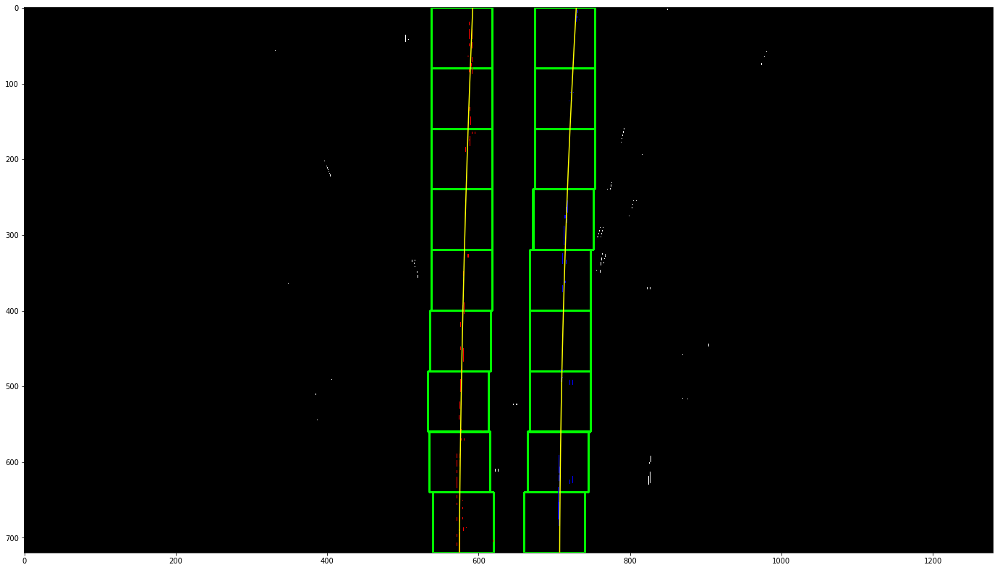

In [460]:
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

f, ax = plt.subplots(1, 1, figsize=(24, 18))
ax.imshow(out_img)
ax.plot(left_fitx, ploty, color='yellow')
ax.plot(right_fitx, ploty, color='yellow')
#f.xlim(0, 1280)
#ax.ylim(720, 0);

In [ ]:
# Assume you now have a new warped binary image 
# from the next frame of video (also called "binary_warped")
# It's now much easier to find line pixels!
nonzero = binary_warped.nonzero()
nonzeroy = np.array(nonzero[0])
nonzerox = np.array(nonzero[1])
margin = 100
left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

# Again, extract left and right line pixel positions
leftx = nonzerox[left_lane_inds]
lefty = nonzeroy[left_lane_inds] 
rightx = nonzerox[right_lane_inds]
righty = nonzeroy[right_lane_inds]
# Fit a second order polynomial to each
left_fit = np.polyfit(lefty, leftx, 2)
right_fit = np.polyfit(righty, rightx, 2)
# Generate x and y values for plotting
ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

In [ ]:
# Create an image to draw on and an image to show the selection window
out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
window_img = np.zeros_like(out_img)
# Color in left and right line pixels
out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

# Generate a polygon to illustrate the search window area
# And recast the x and y points into usable format for cv2.fillPoly()
left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, ploty])))])
left_line_pts = np.hstack((left_line_window1, left_line_window2))
right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, ploty])))])
right_line_pts = np.hstack((right_line_window1, right_line_window2))

# Draw the lane onto the warped blank image
cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
plt.imshow(result)
plt.plot(left_fitx, ploty, color='yellow')
plt.plot(right_fitx, ploty, color='yellow')
plt.xlim(0, 1280)
plt.ylim(720, 0)

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [ ]:
def process_image(image, top=0.60, bottom=1., b_left=0.05, b_right=0.97, t_left=0.47, t_right=0.53):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    transform = pipelineParams()
    transform.set_window(top=top, bottom=bottom,
                                      b_left=b_left, b_right=b_right,
                                      t_left=t_left, t_right=t_right)
    transform.set_vertices(image)
    result = pipeline(image, transform)
    return result

#Adjusted for the challenge video with a slightly different window and using automated Canny Thresholds
def process_image2(image, top=0.62, bottom=0.95, b_left=0.15, b_right=0.97, t_left=0.47, t_right=0.56):
    # NOTE: The output you return should be a color image (3 channel) for processing video below
    # TODO: put your pipeline here,
    # you should return the final output (image where lines are drawn on lanes)
    transform = pipelineParams()
    transform.set_window(top=top, bottom=bottom,
                                      b_left=b_left, b_right=b_right,
                                      t_left=t_left, t_right=t_right)
    transform.set_vertices(image)
    #result = pipeline(image, transform, autocanny=1, show_edges=1)
    result = pipeline(image, transform, autocanny=1)
    return result

In [ ]:
white_output = 'test_videos_output/solidWhiteRight.mp4'
clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4")
white_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

In [ ]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))